In [120]:
%matplotlib inline
import numpy as np
import pylab
import pandas as pd
from collections import Counter
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt

import os
os.environ["ICTDIR"] = "/Users/mistryk2/Packages/IC"
os.environ["ICDIR"] = "/Users/mistryk2/Packages/IC/invisible_cities"
from invisible_cities.io.mcinfo_io import load_mcparticles_df
from invisible_cities.io.mcinfo_io import load_mchits_df
from invisible_cities.io.mcinfo_io import load_mcconfiguration


In [121]:
# Load the configuration
config = load_mcconfiguration("/Users/mistryk2/Packages/nexus/Next100Muons_hallA_example.next.h5") 
config

,param_key,param_value
0,event_type,other
1,num_events,10
2,saved_events,10
3,interacting_events,10
4,/PhysicsList/RegisterPhysics,G4EmStandardPhysics_option4
5,/PhysicsList/RegisterPhysics,G4EmExtraPhysics
6,/PhysicsList/RegisterPhysics,G4DecayPhysics
7,/PhysicsList/RegisterPhysics,G4RadioactiveDecayPhysics
8,/PhysicsList/RegisterPhysics,G4HadronElasticPhysicsHP
9,/PhysicsList/RegisterPhysics,G4HadronPhysicsQGSP_BERT_HP


In [122]:
# Load in the dataframe
# data = load_mcparticles_df("/Users/mistryk2/Packages/nexus/workdir/files/Kr83_full_nexus_ACTIVE_7bar_100ev.sim.h5") 
data = load_mcparticles_df("/Users/mistryk2/Packages/nexus/Next100Muons_hallA_example.next.h5") 
display(data)

,,particle_name,primary,mother_id,initial_x,initial_y,initial_z,initial_t,final_x,final_y,final_z,...,initial_momentum_x,initial_momentum_y,initial_momentum_z,final_momentum_x,final_momentum_y,final_momentum_z,kin_energy,length,creator_proc,final_proc
event_id,particle_id,,,,,,,,,,,,,,,,,,,,,
0,1,mu+,True,0,188.459381,-192.334183,933.310547,0.0,-39300.000000,-31232.785156,-19577.005859,...,-160399.171875,-126032.179688,-83497.601562,-156555.765625,-123078.007812,-81320.906250,220311.828125,54254.226562,none,Transportation
1,1,mu+,True,0,176.262772,134.786224,1059.660645,0.0,-39300.000000,-19310.494141,-5523.393555,...,-211182.609375,-103855.765625,-35338.707031,-208682.718750,-102812.898438,-34804.261719,237871.125000,44495.289062,none,Transportation
2,1,mu+,True,0,92.697174,34.511116,902.893433,0.0,-12600.190430,-12740.232422,-39300.000000,...,-68335.898438,-68935.953125,-216731.750000,-66776.570312,-67192.132812,-211336.968750,237369.859375,44051.972656,none,Transportation
3,1,mu-,True,0,-194.892044,162.735550,864.583618,0.0,-19110.820312,-39300.000000,-2320.935791,...,-102220.171875,-213678.375000,-17105.238281,-99615.937500,-207796.093750,-16796.015625,237381.203125,43877.871094,none,Transportation
4,1,mu-,True,0,-136.560074,208.372406,1158.325684,0.0,-39300.000000,-26227.138672,-11969.439453,...,-195395.203125,-131897.093750,-65377.257812,-193348.234375,-130547.703125,-64825.957031,244537.609375,49040.285156,none,Transportation
5,1,mu+,True,0,-330.662201,266.651489,1179.415527,0.0,-19331.642578,-39300.000000,4031.320557,...,-90229.632812,-188093.312500,13485.461914,-88387.046875,-184027.781250,13242.004883,208945.406250,43985.121094,none,Transportation
6,1,mu-,True,0,346.237030,152.596497,232.646820,0.0,-39300.000000,-33669.527344,-20405.720703,...,-144347.437500,-123186.859375,-75141.687500,-141513.984375,-120704.976562,-73661.171875,203995.953125,56050.894531,none,Transportation
7,1,mu+,True,0,-43.963219,384.850891,197.967667,0.0,-19746.941406,-32987.800781,-39300.000000,...,-77539.453125,-131546.078125,-155518.890625,-76220.265625,-129079.039062,-152786.515625,217845.890625,55335.617188,none,Transportation
8,1,mu+,True,0,451.498108,-55.136467,134.163452,0.0,-39300.000000,-24034.595703,-20595.765625,...,-163073.906250,-98268.398438,-84889.968750,-159402.875000,-96190.648438,-83144.429688,208355.593750,50842.171875,none,Transportation


In [123]:
data['P'] = np.sqrt(data["initial_momentum_x"]*data["initial_momentum_x"] + data["initial_momentum_y"]*data["initial_momentum_y"] +data["initial_momentum_z"]*data["initial_momentum_z"])

In [124]:
bins_x = np.linspace(1, -1,100)
bins_z = np.linspace(1, -1,100)

hist_data = plt.hist2d(data["initial_momentum_x"]/data['P'], data["initial_momentum_z"]/data['P'], bins=[bins_x, bins_z])
plt.xlabel("X dir", fontsize=18)
plt.ylabel("Z dir", fontsize=18)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15) 
plt.tight_layout()
plt.show() 

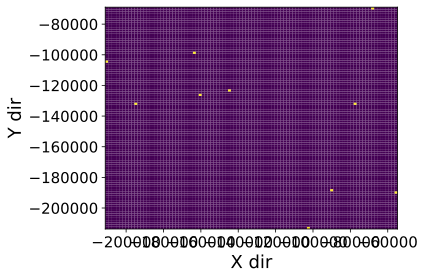

In [125]:
hist_data = plt.hist2d(data["initial_momentum_x"], data["initial_momentum_y"], bins=100)
plt.xlabel("X dir", fontsize=18)
plt.ylabel("Y dir", fontsize=18)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15) 
plt.tight_layout()
plt.show() 

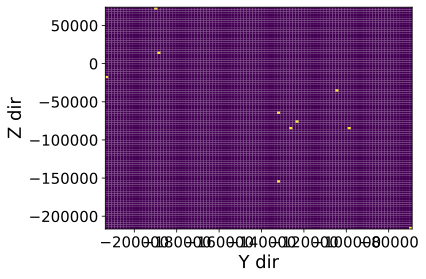

In [126]:
hist_data = plt.hist2d(data["initial_momentum_y"], data["initial_momentum_z"], bins=100)
plt.xlabel("Y dir", fontsize=18)
plt.ylabel("Z dir", fontsize=18)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15) 
plt.tight_layout()
plt.show() 